<a href="https://colab.research.google.com/github/snowshine/NFTCreators/blob/main/gan/nftcreator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup

### Google Drive Setup
for running on Google Colab only

In [1]:
from google.colab import drive
# drive.flush_and_unmount()
drive.mount('/content/gdrive', force_remount=True)

import sys
sys.path.append('/content/gdrive/MyDrive/capstone/gan/')

# change working directory to this notebook location
%cd /content/gdrive/MyDrive/capstone/gan
!ls -art

Mounted at /content/gdrive
/content/gdrive/MyDrive/capstone/gan
ganevaluation.py  imagedata.py	dcgan.py  __pycache__  nftcreator.ipynb


In [2]:
# drive.flush_and_unmount()

### Imports and Computing Environment
- Included modules are in the same directory of this notebook
- Tensorflow version 2.8.0
- At least one GPU required

In [5]:
from dcgan import *
from imagedata import *
from ganevaluation import *

import tensorflow as tf
import psutil
print('Num of CPUs:', psutil.cpu_count(), "; Num of GPUs:", len(tf.config.list_physical_devices('GPU')))
print("total memory:", '{:0,.0f}'.format(psutil.virtual_memory().total), "; memory available:", '{:0,.0f}'.format(psutil.virtual_memory().available))

print('TF version:', tf.__version__, '; GPU name:', tf.test.gpu_device_name())

Num of CPUs: 4 ; Num of GPUs: 1
total memory: 27,337,134,080 ; memory available: 25,657,937,920
TF version: 2.8.0 ; GPU name: /device:GPU:0


### Setup Parameters


In [15]:
# source data parameters
# source file: <datapath>/<collection>.<datatype>
collection = "cool-cats"
datapath = '../data/'
outputpath = '../output/'
datatype = 'npz'  # npz, zip, or img

# image resolution and channel, 128 is the highest for CoLab (with GPU)
# support (128, 128, 3) and (32, 32, 3)
image_shape = (128, 128, 3)  

# adjust depending on size of the dataset, image resolution and computing enviornment
# tried 16, 32, 64, 128, 256, 1024
# for Colab: 128 works best for (128,128,3). 256 may work, but OOM for 20k RGB 128 collections
# smaller batch size has better performance for (32,32,3). i.e. 16(cryptopunks32), 32(hapeprime32)
batch_size = 128

# training parameters
startepoch = 496  # 0:initial training, others: continue
epochs = 500  # how many epochs to run

### Loading Data

In [7]:
imgdata = imagedata(collection, datapath)
train_dataset = imgdata.load_dataset(datatype, batch_size, image_shape)

## Model Training

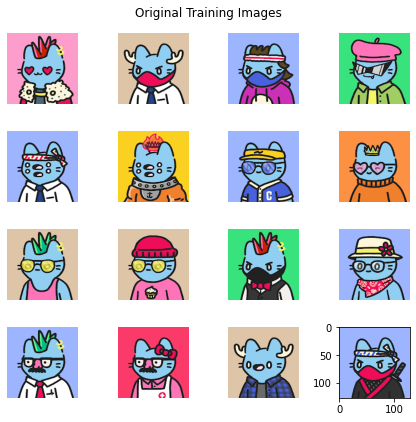

/content/gdrive/MyDrive/capstone/gan/dcgan.py:436: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  fig.add_subplot(grid_size, grid_size, 1 + i) #(ROW,COLUMN,POSITION)


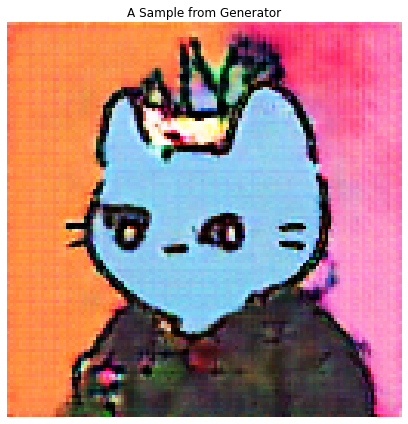

In [9]:
gan = dcgan(collection, outputpath, startepoch, image_shape)
gan.view_orig_images(train_dataset)

if startepoch > 0:
    gan.view_generated_sample()

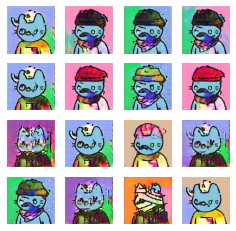

Epoch 421, generator_loss=6.7824296951293945,discriminator_loss=0.34070053696632385, run_time=0:00:51.70


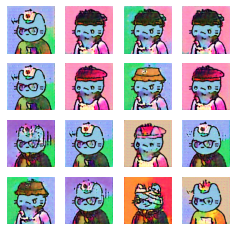

Epoch 422, generator_loss=7.278933048248291,discriminator_loss=0.33723872900009155, run_time=0:00:44.91


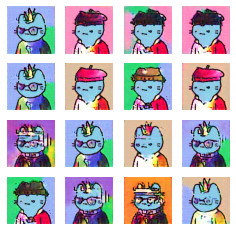

Epoch 423, generator_loss=7.393631458282471,discriminator_loss=0.33622241020202637, run_time=0:00:44.90


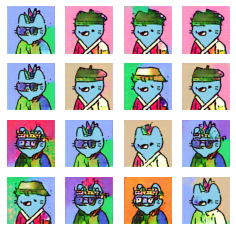

Epoch 424, generator_loss=7.268621921539307,discriminator_loss=0.3386191725730896, run_time=0:00:44.91


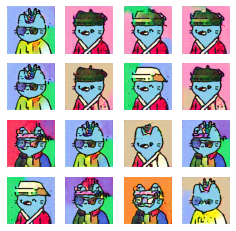

Epoch 425, generator_loss=7.682724952697754,discriminator_loss=0.3330136239528656, run_time=0:00:45.26


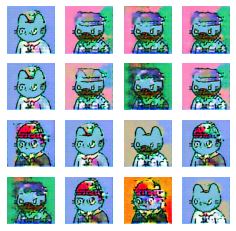

Epoch 426, generator_loss=5.925693035125732,discriminator_loss=0.3937878906726837, run_time=0:00:44.98


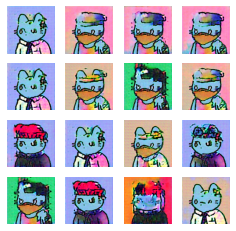

Epoch 427, generator_loss=6.254846572875977,discriminator_loss=0.34185168147087097, run_time=0:00:44.92


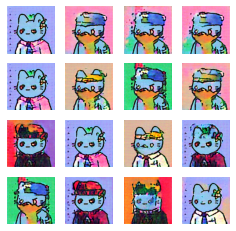

Epoch 428, generator_loss=6.853521823883057,discriminator_loss=0.338845431804657, run_time=0:00:44.92


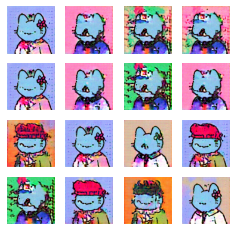

Epoch 429, generator_loss=6.74802303314209,discriminator_loss=0.36818742752075195, run_time=0:00:44.84


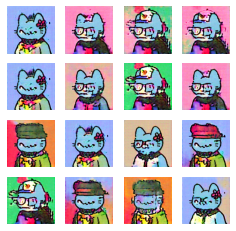

Epoch 430, generator_loss=6.605957508087158,discriminator_loss=0.3349328339099884, run_time=0:00:45.18


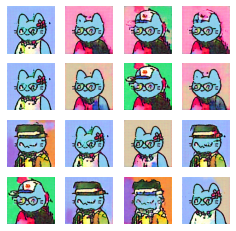

Epoch 431, generator_loss=6.967476844787598,discriminator_loss=0.3355747163295746, run_time=0:00:44.65


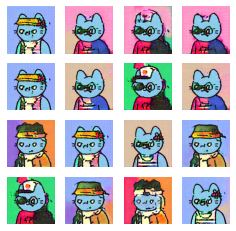

Epoch 432, generator_loss=7.16417121887207,discriminator_loss=0.3326019048690796, run_time=0:00:44.67


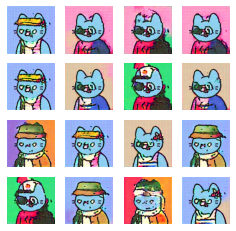

Epoch 433, generator_loss=7.375410556793213,discriminator_loss=0.33085426688194275, run_time=0:00:44.68


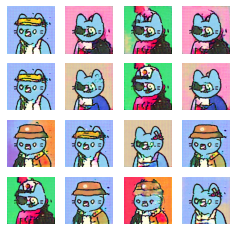

Epoch 434, generator_loss=7.395894527435303,discriminator_loss=0.3312760293483734, run_time=0:00:44.97
INFO:tensorflow:Assets written to: ../output/cool-cats/generator435/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator435/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/generator/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator/assets


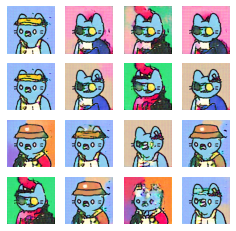

Epoch 435, generator_loss=7.4173102378845215,discriminator_loss=0.3311164081096649, run_time=0:00:57.67


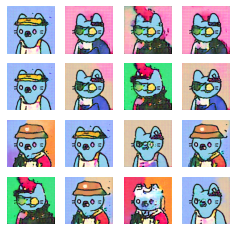

Epoch 436, generator_loss=7.451852798461914,discriminator_loss=0.3302890360355377, run_time=0:00:44.69


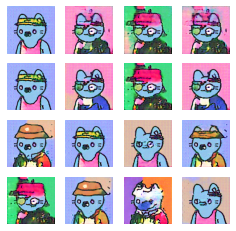

Epoch 437, generator_loss=7.498048305511475,discriminator_loss=0.33226656913757324, run_time=0:00:44.69


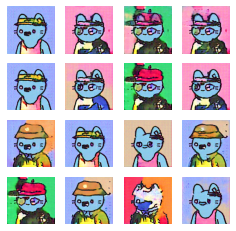

Epoch 438, generator_loss=7.674322128295898,discriminator_loss=0.3302125930786133, run_time=0:00:45.04


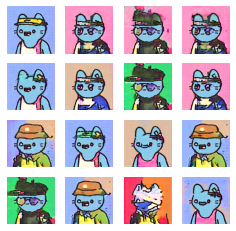

Epoch 439, generator_loss=7.759860515594482,discriminator_loss=0.32947108149528503, run_time=0:00:44.68


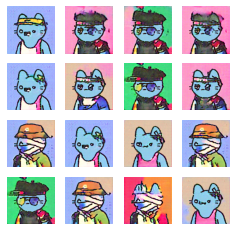

Epoch 440, generator_loss=7.620999336242676,discriminator_loss=0.32958051562309265, run_time=0:00:44.69


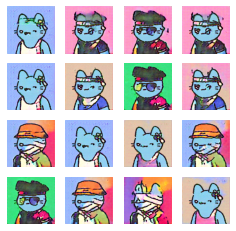

Epoch 441, generator_loss=7.683360576629639,discriminator_loss=0.32965022325515747, run_time=0:00:44.69


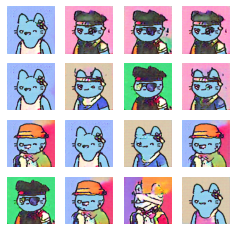

Epoch 442, generator_loss=8.022757530212402,discriminator_loss=0.33003872632980347, run_time=0:00:44.66


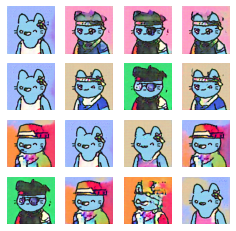

Epoch 443, generator_loss=7.550777435302734,discriminator_loss=0.332489937543869, run_time=0:00:45.03


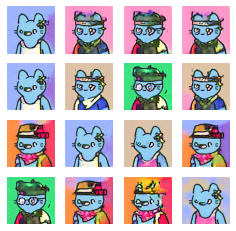

Epoch 444, generator_loss=7.780975818634033,discriminator_loss=0.32936176657676697, run_time=0:00:44.68


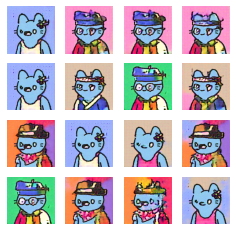

Epoch 445, generator_loss=7.638490200042725,discriminator_loss=0.33044183254241943, run_time=0:00:44.74


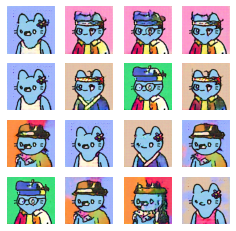

Epoch 446, generator_loss=7.921768665313721,discriminator_loss=0.32882004976272583, run_time=0:00:44.70


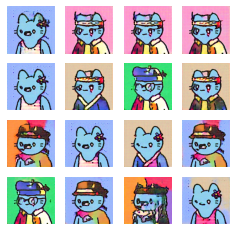

Epoch 447, generator_loss=8.221192359924316,discriminator_loss=0.3281462490558624, run_time=0:00:44.97


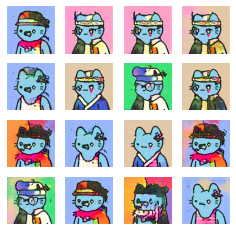

Epoch 448, generator_loss=8.175159454345703,discriminator_loss=0.3284872770309448, run_time=0:00:44.70


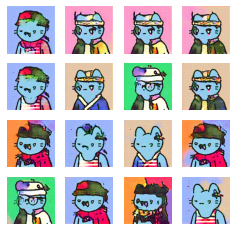

Epoch 449, generator_loss=8.170302391052246,discriminator_loss=0.3289461135864258, run_time=0:00:44.72
INFO:tensorflow:Assets written to: ../output/cool-cats/generator450/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator450/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/generator/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator/assets


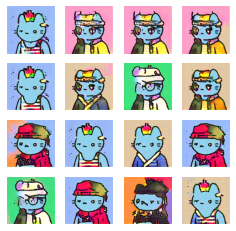

Epoch 450, generator_loss=8.114084243774414,discriminator_loss=0.3286641538143158, run_time=0:00:57.82


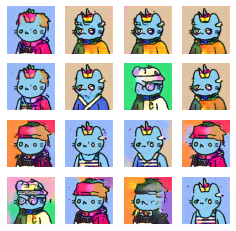

Epoch 451, generator_loss=8.018982887268066,discriminator_loss=0.32903194427490234, run_time=0:00:44.69


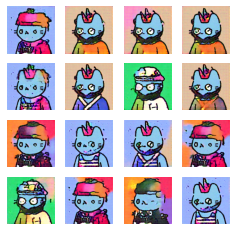

Epoch 452, generator_loss=7.941178798675537,discriminator_loss=0.32795286178588867, run_time=0:00:44.98


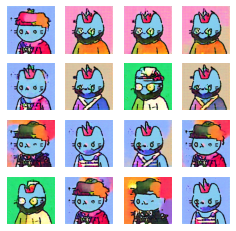

Epoch 453, generator_loss=7.979098320007324,discriminator_loss=0.32807981967926025, run_time=0:00:44.71


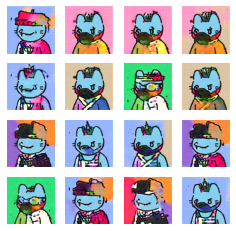

Epoch 454, generator_loss=7.5969696044921875,discriminator_loss=0.3317008912563324, run_time=0:00:44.75


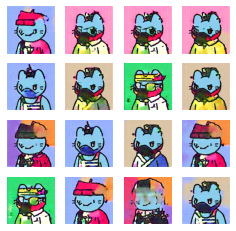

Epoch 455, generator_loss=7.913419723510742,discriminator_loss=0.3295620381832123, run_time=0:00:44.67


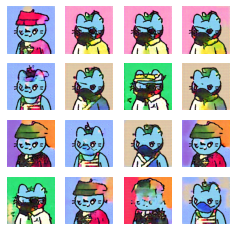

Epoch 456, generator_loss=8.193873405456543,discriminator_loss=0.3282427489757538, run_time=0:00:44.98


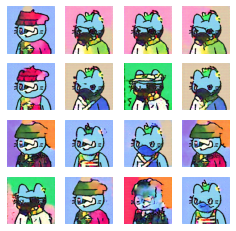

Epoch 457, generator_loss=8.223976135253906,discriminator_loss=0.3274737596511841, run_time=0:00:44.71


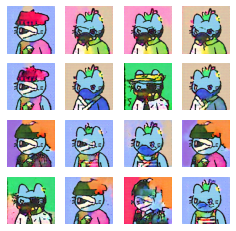

Epoch 458, generator_loss=8.305181503295898,discriminator_loss=0.3267914056777954, run_time=0:00:44.68


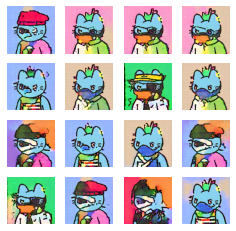

Epoch 459, generator_loss=8.50383472442627,discriminator_loss=0.3271852135658264, run_time=0:00:44.69


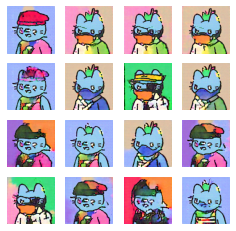

Epoch 460, generator_loss=8.568660736083984,discriminator_loss=0.32633280754089355, run_time=0:00:44.98


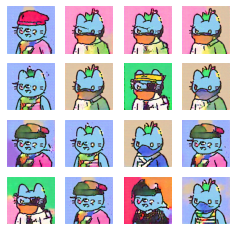

Epoch 461, generator_loss=8.846385955810547,discriminator_loss=0.32621654868125916, run_time=0:00:44.70


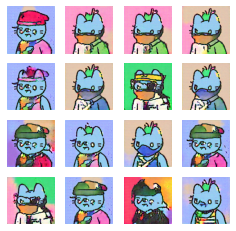

Epoch 462, generator_loss=8.985532760620117,discriminator_loss=0.3263532817363739, run_time=0:00:44.70


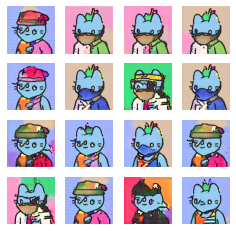

Epoch 463, generator_loss=8.923736572265625,discriminator_loss=0.32598912715911865, run_time=0:00:44.71


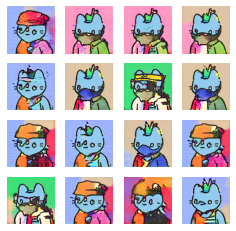

Epoch 464, generator_loss=8.606578826904297,discriminator_loss=0.3265252411365509, run_time=0:00:44.66
INFO:tensorflow:Assets written to: ../output/cool-cats/generator465/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator465/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/generator/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator/assets


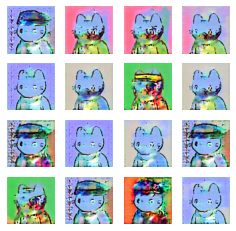

Epoch 465, generator_loss=7.428595066070557,discriminator_loss=0.44798025488853455, run_time=0:00:58.03


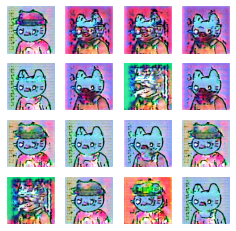

Epoch 466, generator_loss=5.120724201202393,discriminator_loss=0.3736545145511627, run_time=0:00:44.74


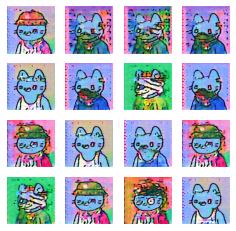

Epoch 467, generator_loss=6.0461320877075195,discriminator_loss=0.34669229388237, run_time=0:00:44.66


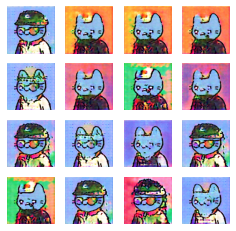

Epoch 468, generator_loss=6.622157096862793,discriminator_loss=0.37909090518951416, run_time=0:00:44.69


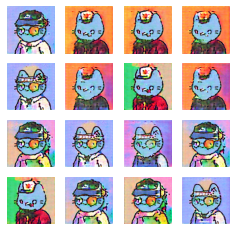

Epoch 469, generator_loss=6.762393951416016,discriminator_loss=0.3377440571784973, run_time=0:00:45.07


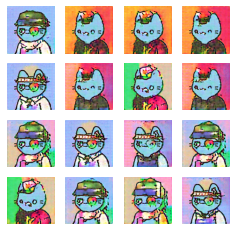

Epoch 470, generator_loss=6.987678050994873,discriminator_loss=0.33336615562438965, run_time=0:00:44.68


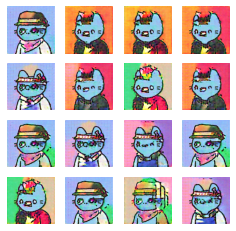

Epoch 471, generator_loss=7.160189628601074,discriminator_loss=0.33584147691726685, run_time=0:00:44.71


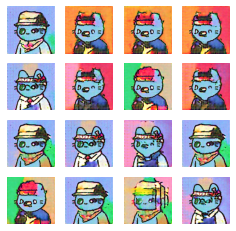

Epoch 472, generator_loss=6.9210686683654785,discriminator_loss=0.3336036503314972, run_time=0:00:44.69


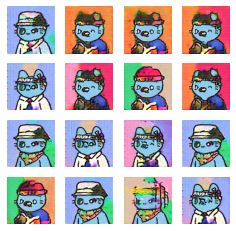

Epoch 473, generator_loss=7.222190856933594,discriminator_loss=0.33236271142959595, run_time=0:00:44.70


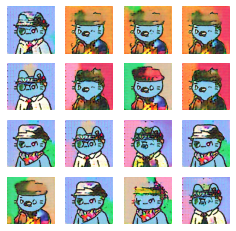

Epoch 474, generator_loss=7.4311089515686035,discriminator_loss=0.3302287459373474, run_time=0:00:44.95


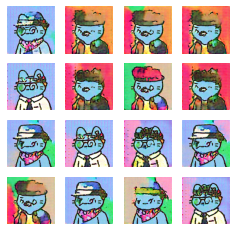

Epoch 475, generator_loss=7.343255519866943,discriminator_loss=0.3306027054786682, run_time=0:00:44.68


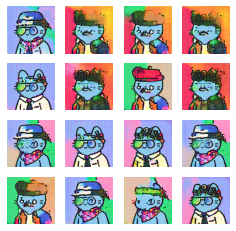

Epoch 476, generator_loss=7.71417236328125,discriminator_loss=0.3315126597881317, run_time=0:00:44.67


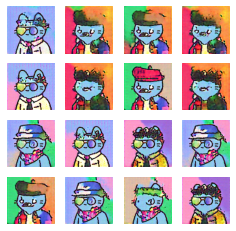

Epoch 477, generator_loss=7.881773471832275,discriminator_loss=0.3293674886226654, run_time=0:00:44.70


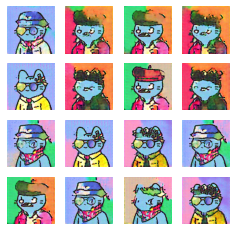

Epoch 478, generator_loss=7.8673858642578125,discriminator_loss=0.3286358714103699, run_time=0:00:45.01


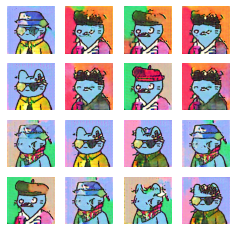

Epoch 479, generator_loss=7.360381126403809,discriminator_loss=0.33026885986328125, run_time=0:00:44.68
INFO:tensorflow:Assets written to: ../output/cool-cats/generator480/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator480/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/generator/assets
INFO:tensorflow:Assets written to: ../output/cool-cats/discriminator/assets


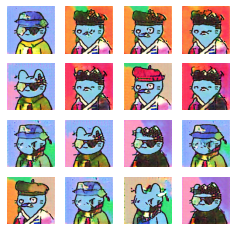

Epoch 480, generator_loss=7.580087661743164,discriminator_loss=0.32949936389923096, run_time=0:00:58.07


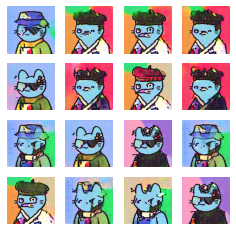

Epoch 481, generator_loss=7.716397285461426,discriminator_loss=0.3301357924938202, run_time=0:00:44.73


In [ ]:
# start/continue training
gan.train(train_dataset, startepoch, epochs, batch_size)

## Model Architecture Summary

### Generator Summary

In [10]:
GENERATOR = gan.GENERATOR
DISCRIMINATOR = gan.DISCRIMINATOR

GENERATOR.summary()

Model: "Generator128x128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 batch_normalization (BatchN  (None, 4096)             16384     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        1048832   
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 256)   

### Discriminator Summary

In [11]:
DISCRIMINATOR.summary()

Model: "Discriminator128x128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      3136      
                                                                 
 batch_normalization_6 (Batc  (None, 128, 128, 64)     256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 128, 128, 64)      0         
                                                                 
 dropout (Dropout)           (None, 128, 128, 64)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)        65600     
                                                                 
 batch_normalization_7 (Batc  (None, 64, 64, 64)       256       
 hNormalization)                              

### Generator Model Plot

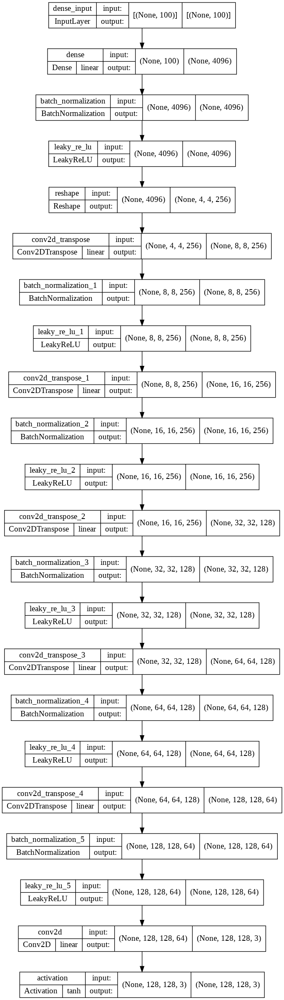

In [12]:
# plot the model
plotfile = outputpath + collection + '/generator_plot.png'
tf.keras.utils.plot_model(GENERATOR, to_file=plotfile, show_shapes=True, show_layer_names=True, show_layer_activations=True)

### Discriminator Model Plot

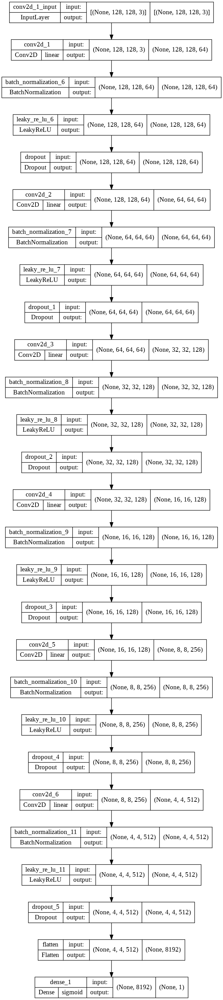

In [13]:
plotfile = outputpath + collection + '/discriminator_plot.png'
tf.keras.utils.plot_model(DISCRIMINATOR, to_file=plotfile, show_shapes=True, show_layer_names=True, show_layer_activations=True)

## Model Evaluation
##### Sample from the final generator
##### Loss Charts 
##### Inception Score (IS)
- Using the pre-trained Inception v3 model to classify the generated images. 
- The score has 2 criteria for the generated images:
  - quality: how much each image looks like a known class 
  - variety: how diverse the set represent different known classes.
- A higher inception score indicates better-quality generated images.

##### Frechet Inception Distance (FID)
- Same as the inception score, the FID score also uses the inception v3 model. 
- The score calculate the distance between real images and generated images using the Frechet distance.
- A lower FID score indicates more realistic images that match the statistical properties of real images.
- FID is consistent with human judgments and is more robust to noise than IS.

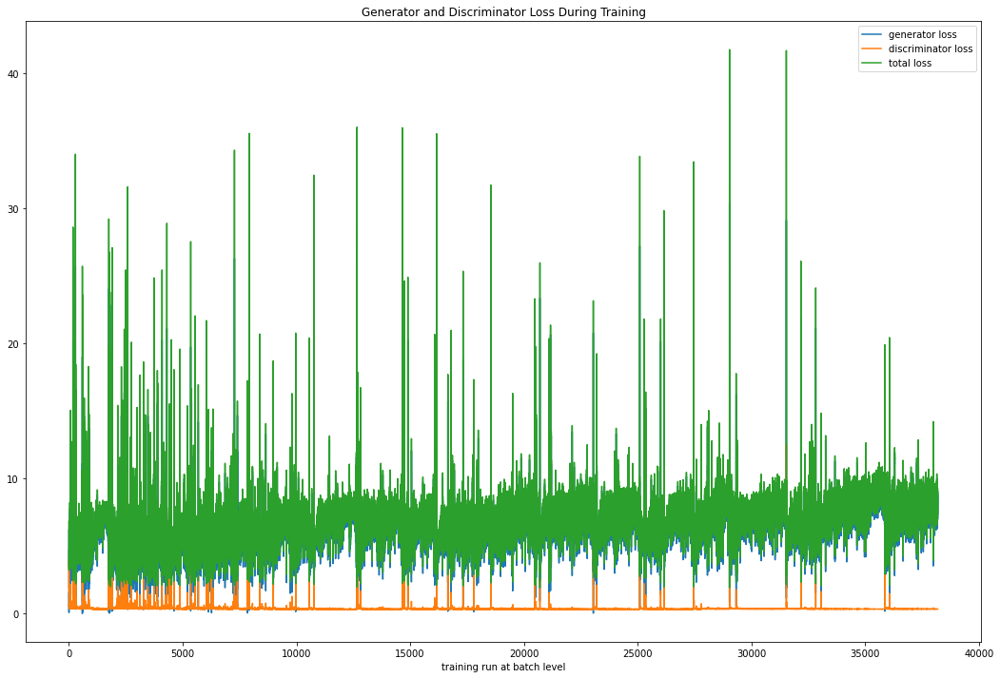

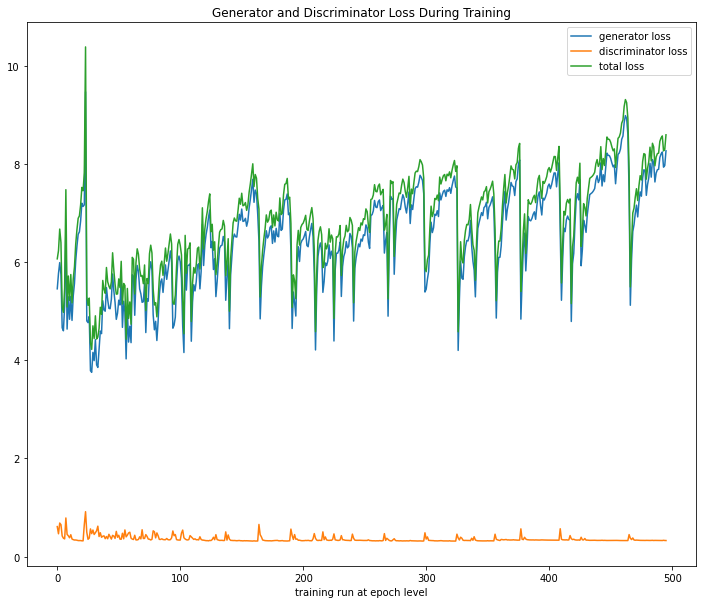

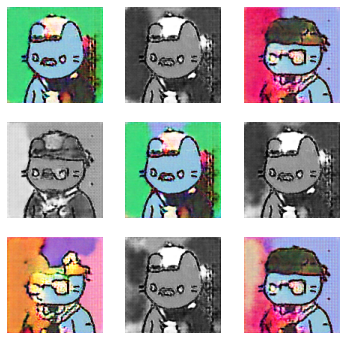

Collection: cool-cats  at epoch  150
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.006


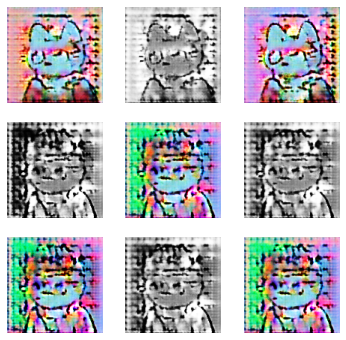

Collection: cool-cats  at epoch  165
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.034


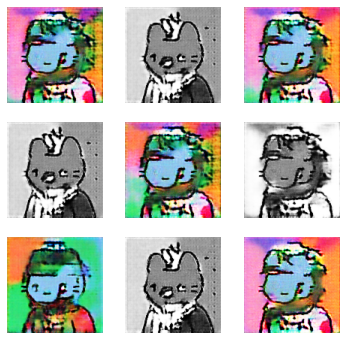

Collection: cool-cats  at epoch  180
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.008


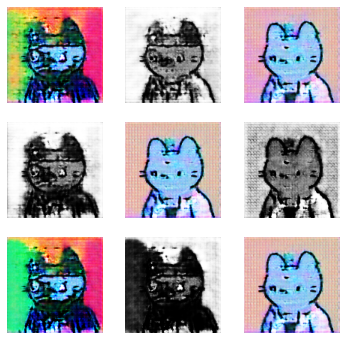

Collection: cool-cats  at epoch  195
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.010


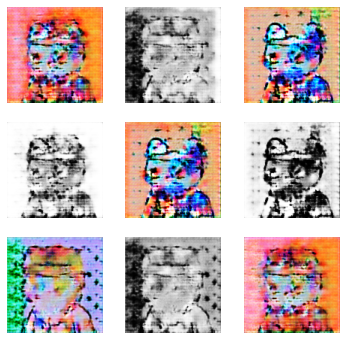

Collection: cool-cats  at epoch  210
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.030


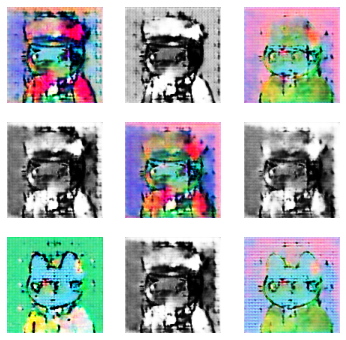

Collection: cool-cats  at epoch  225
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.020


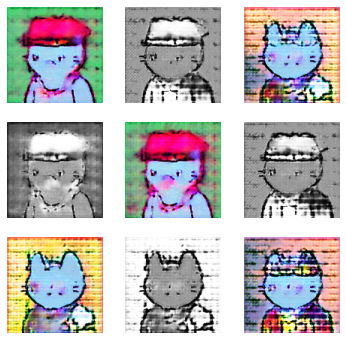

Collection: cool-cats  at epoch  240
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.012


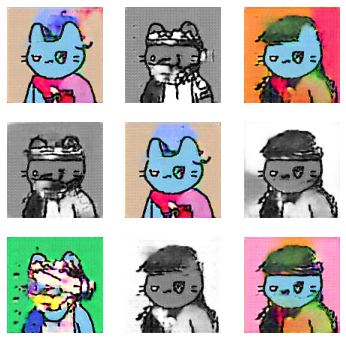

Collection: cool-cats  at epoch  255
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.016


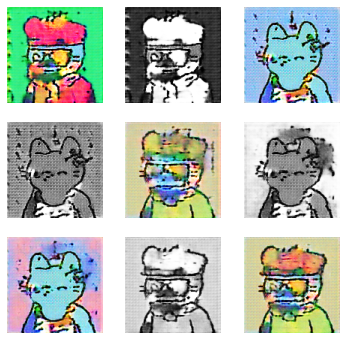

Collection: cool-cats  at epoch  270
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.008


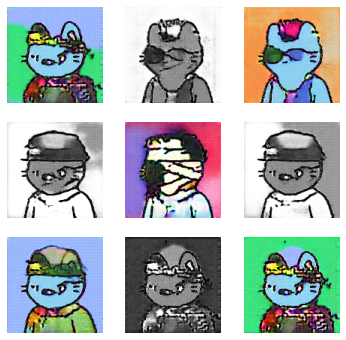

Collection: cool-cats  at epoch  285
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.011


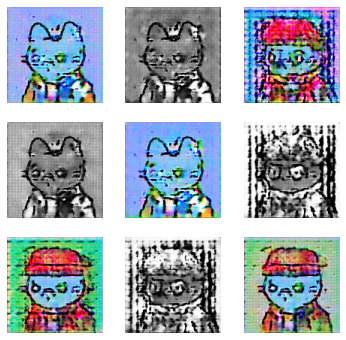

Collection: cool-cats  at epoch  300
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.016


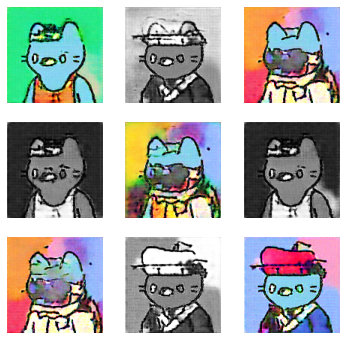

Collection: cool-cats  at epoch  315
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.013


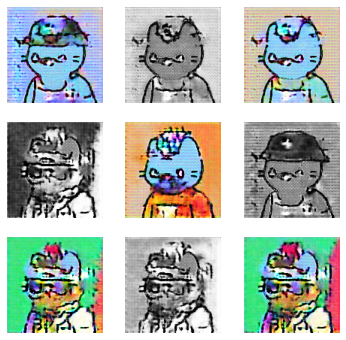

Collection: cool-cats  at epoch  330
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.012


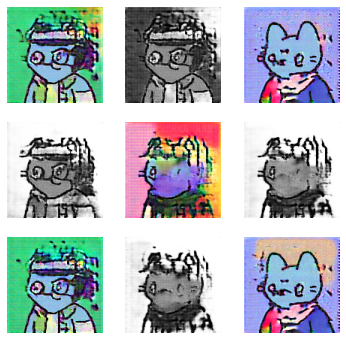

Collection: cool-cats  at epoch  345
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.036


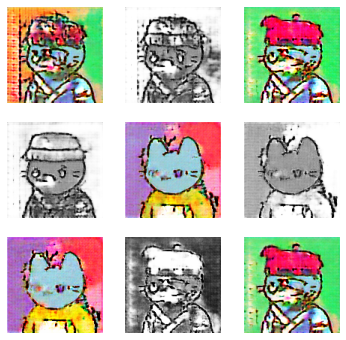

Collection: cool-cats  at epoch  360
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.010


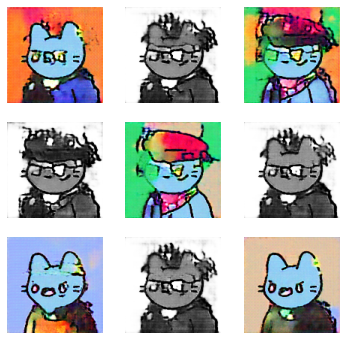

Collection: cool-cats  at epoch  375
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.008


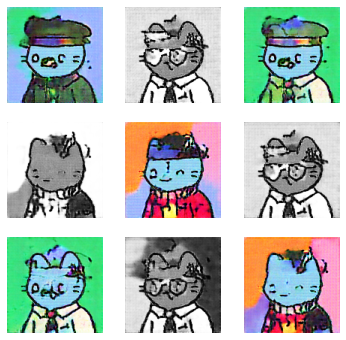

Collection: cool-cats  at epoch  390
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.008


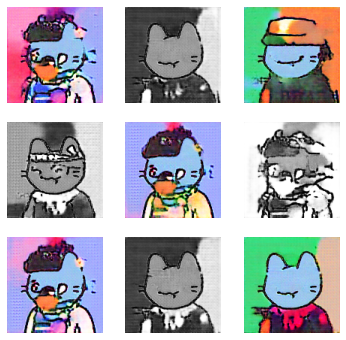

Collection: cool-cats  at epoch  405
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.005


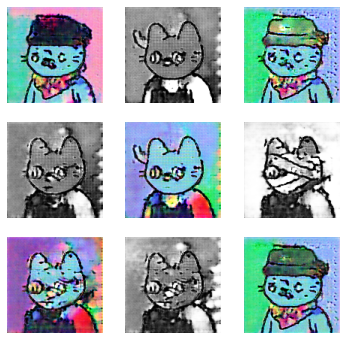

Collection: cool-cats  at epoch  420
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.010


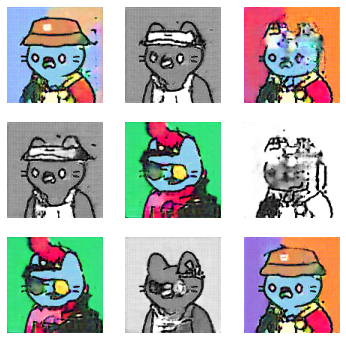

Collection: cool-cats  at epoch  435
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.006


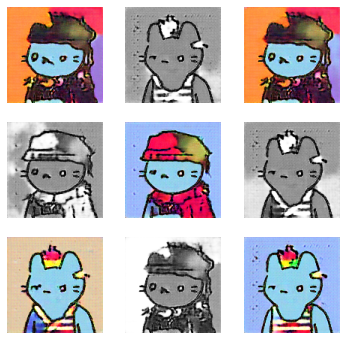

Collection: cool-cats  at epoch  450
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.009


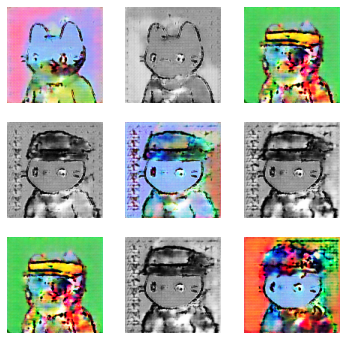

Collection: cool-cats  at epoch  465
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.006


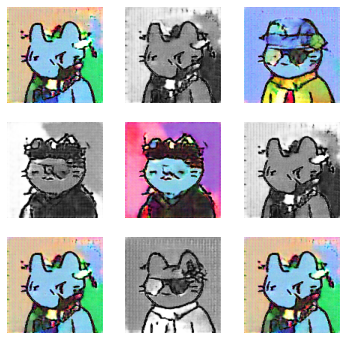

Collection: cool-cats  at epoch  480
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.009


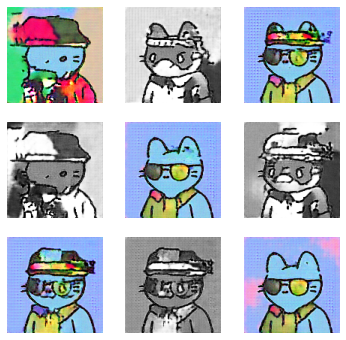

Collection: cool-cats  at epoch  495
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.006


In [16]:
# evaluate each saved generators
# normally start after 100 epoch when generated images showing something
startepoch = 150
# endepoch is the total epochs
# endepoch = epochs
endepoch = 495
generator_epoch = range(startepoch,endepoch + 1,15)
# generator_epoch = [435,495]

# Evaluations
ganeval = ganevaluation(collection, datapath, outputpath)

# manual evaluation of generated images as well as IS and FID scores
for epoch in generator_epoch:
  o_is_avg, o_is_std, g_is_avg, g_is_std, fid = ganeval.evaluate_epoch(epoch)
  print('Collection:', collection, ' at epoch ', epoch)
  print('IS score for original images', o_is_avg, ' with std ', o_is_std)
  print('IS score for generated images', g_is_avg, ' with std ', g_is_std)
  print('FID: %.3f' % fid)

# display training loss metrics, both batch and epoch level
ganeval.loss_metrics_chart('batch')
ganeval.loss_metrics_chart('epoch')

## Best Practice and Challenges

#### Best Practice Followed

Model:
- Using Strided Convolutions for Downsample and Upsample instead of pooling
- Adding Gaussian Weight Initial noise to every layer of generator
- Using Batch Normalization
- Using LeakyReLU instead of ReLU, with a default slope of 0.2
- Using Dropout in descriminator (and generator?)
- use the tanh activation function to ensure generator output range [-1,1]

Optimizer:
- Using the Adam version of stochastic gradient descent (SGD) 
- Using Two Time-Scale Update Rule (TTUR): 
  - different learning rates for generator and discriminator
  - tuning learning rate, start with 0.0002
  - Using beta1 momentum of 0.5 instead of the default of 0.9

Training Process
- Scale/normalize images from [0,255] to the range [-1,1]
- Using Tanh as the last layer of the generator to output [-1,1]
- Train the discriminator with separate batches of real and fake images
- Using one-sided Label Smoothing to tune down discriminator to avoid overconfidence





#### Challenges

some of the well-known challenges:

- Non-convergence
  - No objective loss function for the GAN model overall performance    
    - The losses of Descriminator and Generator are measured individually
    - can't determine the relative/absolute GAN model quality from loss alone  
    - no way to objectively assess the progress of the training 
  - model is “good” when an equilibrium is reached between G and D 
    - typically when the discriminator’s loss is around 0.5
  - Training for a long time doesn’t always make the generator better, may worse
  - When D loss goes to 0, that's the failure mode
  - if loss of generator steadily decreases, then it's fooling D with garbage (says martin)  
  - Vanishing Gradients
  - 
- Mode collapse
  - generator produces the same or a small subset of the images repeatedly.
  
- Difficult to evaluate
  - In general no objective ways to evaluate the GAN performance
  - Subjective evaluation or manual inspection of generated images
  - Quantitative measures can be combined with qualitative assessment
    - the inception score
    - the Frechet inception distance

- Computing Environment
  - Colab(free): OOM at batch size 256
    - only when GPU available: batch size 128, run_time=0:02:22.20 per epoch
  - Colab pro: 
    - TPU: OOM at batch size 1024; batch size 512, run_time=0:30:27.46 per epoch
    - GPU: OOM at batch size 256;  batch size 128, run_time=0:01:31.42 per epoch